In [5]:
import sys
import os
import pytesseract
import re
os.chdir("/home/scai/PhenPred")
import importlib
import PhenPred
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PhenPred.vae import shap_folder, plot_folder
from PhenPred.vae.Hypers import Hypers
from PhenPred.vae.DatasetDepMap23Q2 import CLinesDatasetDepMap23Q2
from PhenPred.vae.Train import CLinesTrain
import dipvae_metrics

In [6]:
importlib.reload(dipvae_metrics)

<module 'dipvae_metrics' from '/home/scai/PhenPred/PhenPred/vae/DIP-VAE/dipvae_metrics.py'>

In [8]:
timestamp_nodipvae = "20240805_132345" #all datasets, no disentanglement, 500 epochs
# timestamp_dipvae = "20240805_131847" #all datasets w/ disentanglement, lambda_d = lambda_od = 0.001, 500 epochs
timestamp_dipvae = "20241210_000556"


vae_latent_nodipvae = pd.read_csv(f"{plot_folder}/files/{timestamp_nodipvae}_latent_joint.csv.gz", index_col=0)
vae_latent_dipvae = pd.read_csv(f"{plot_folder}/files/{timestamp_dipvae}_latent_joint.csv.gz", index_col=0)

Cancer cell lines Latent Space Representation

<Axes: >

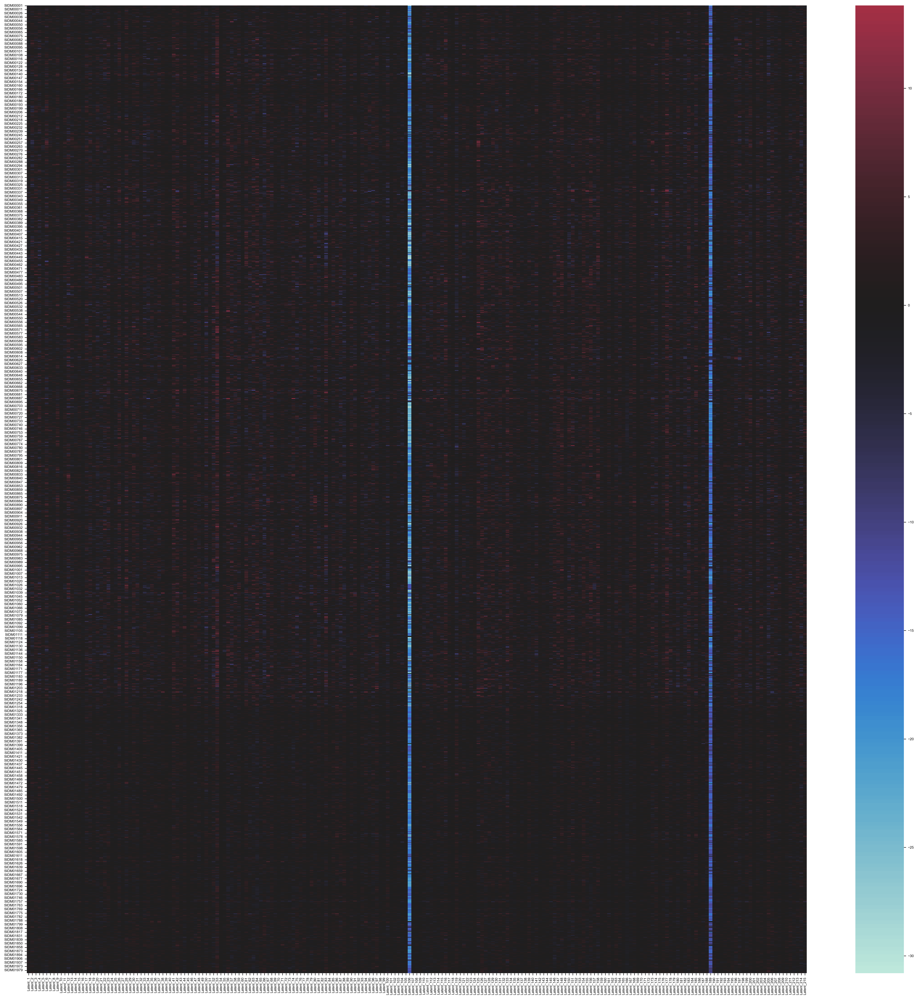

In [10]:
# No dipvae
# Samples vs latents
plt.figure(figsize=(30, 30)) 
sns.heatmap(vae_latent_nodipvae, annot=False, center= 0)

Text(1056.1666666666665, 0.5, 'Latent Dimensions')

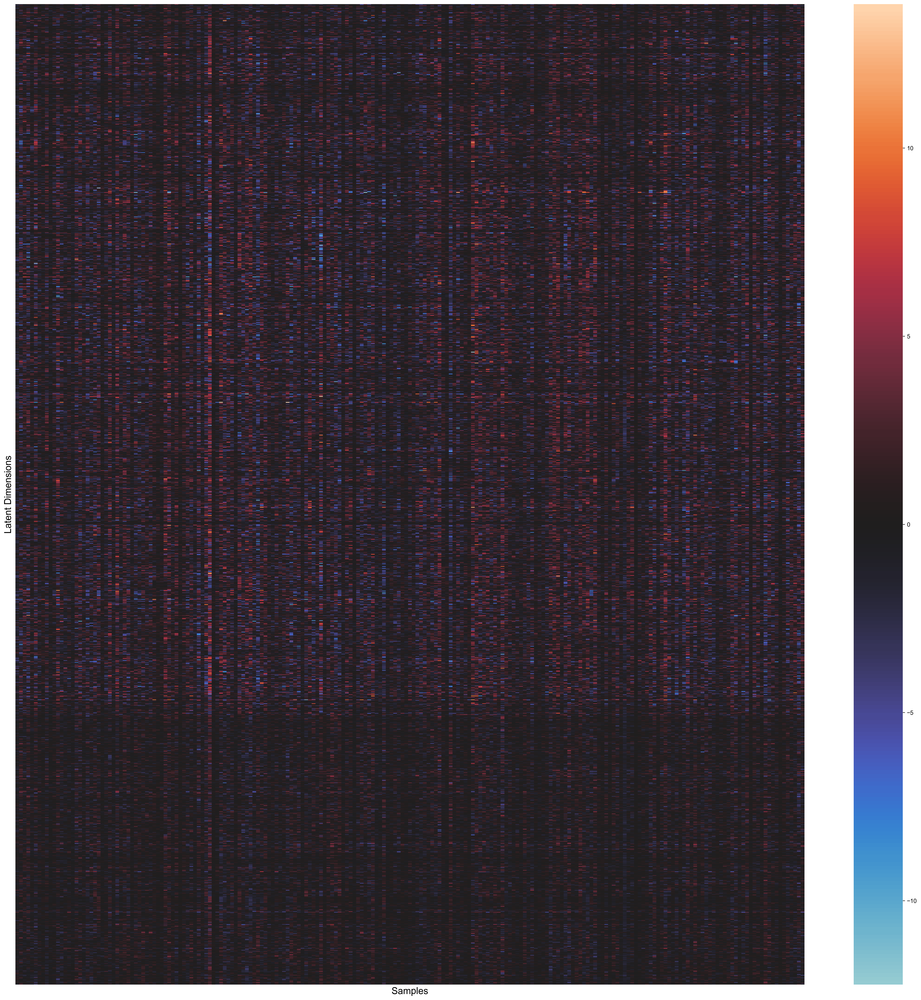

In [11]:
# Samples vs latents after dropping two dominant latent dimensions
plt.figure(figsize=(30, 30)) 
sns.heatmap(vae_latent_nodipvae.drop(["Latent_106", "Latent_189"], axis = 1), annot=False, center= 0)

# Customize the color bar font size
cbar = plt.gca().collections[0].colorbar
cbar.ax.tick_params(labelsize=10) 

plt.xticks([])
plt.yticks([])
plt.xlabel('Samples', fontsize=16) 
plt.ylabel('Latent Dimensions', fontsize=16) 

<Axes: >

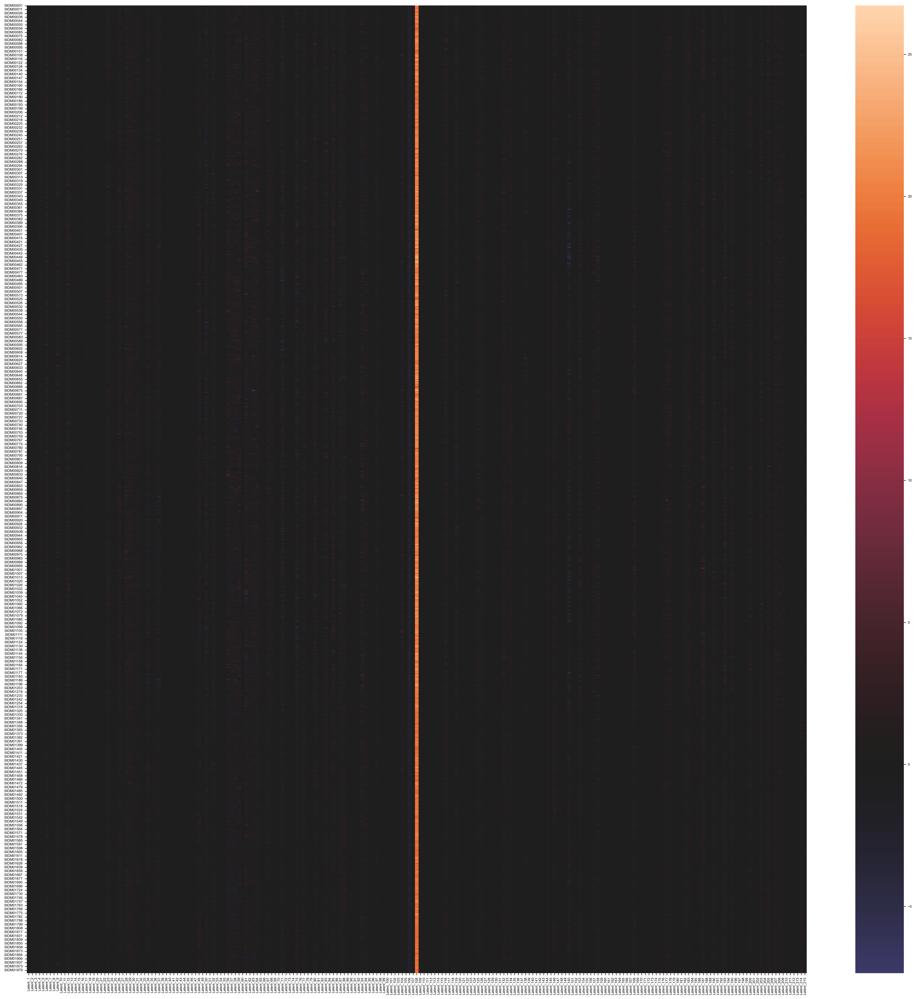

In [12]:
# lambda_d = lambda_od = 0.001
# Samples vs latents
plt.figure(figsize=(30, 30)) 
sns.heatmap(vae_latent_dipvae, annot=False, center= 0)

Text(1056.1666666666665, 0.5, 'Latent Dimensions')

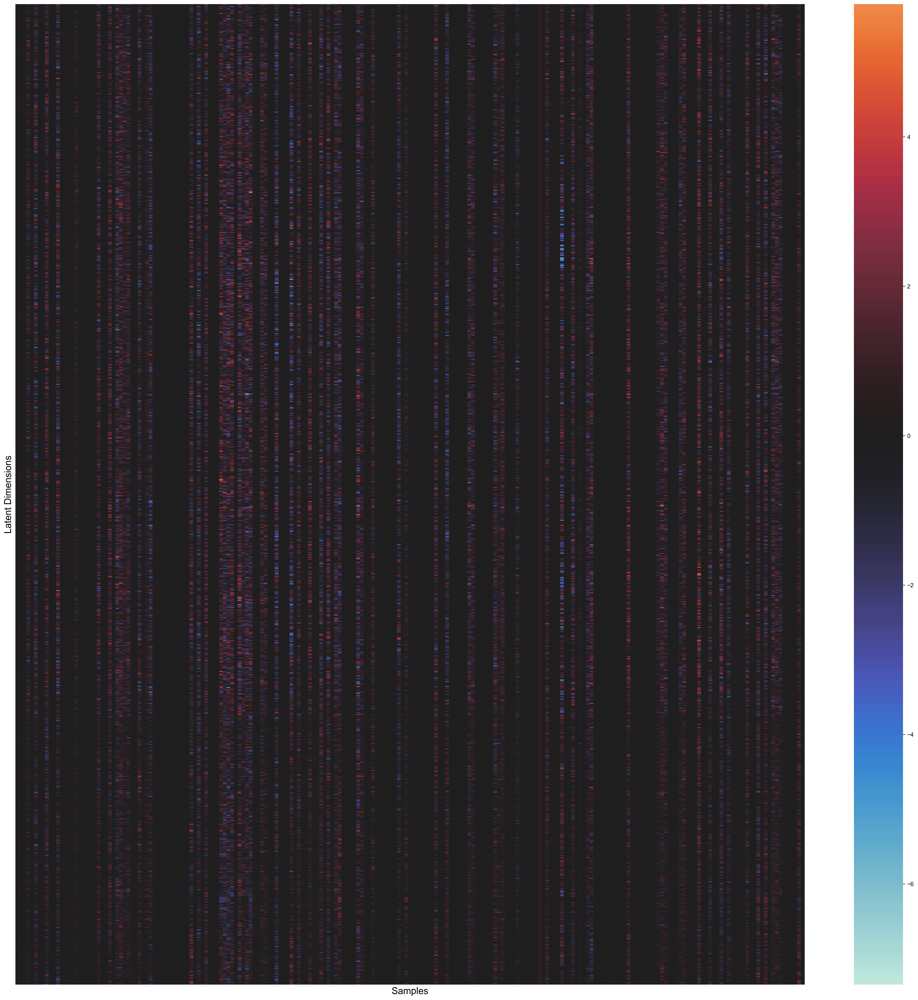

In [13]:
# lambda_d = lambda_od = 0.001
# Samples vs latents
plt.figure(figsize=(30, 30)) 
sns.heatmap(vae_latent_dipvae.drop(["Latent_106", "Latent_108"], axis = 1), annot=False, center= 0)

cbar = plt.gca().collections[0].colorbar
cbar.ax.tick_params(labelsize=10) 

plt.xticks([])
plt.yticks([])
plt.xlabel('Samples', fontsize=16) 
plt.ylabel('Latent Dimensions', fontsize=16)  

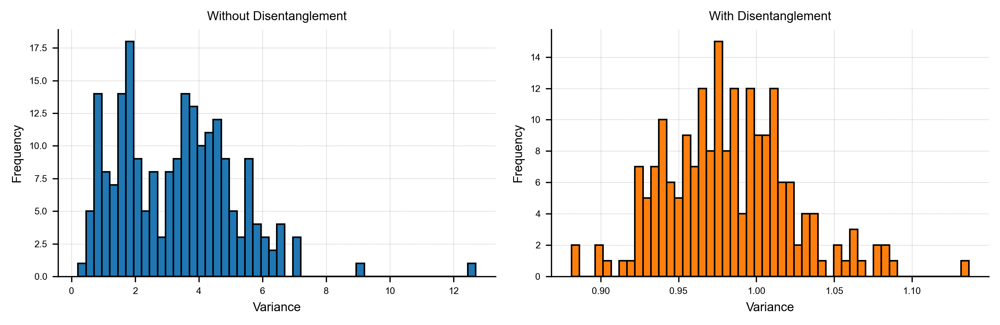

In [9]:
# Variance of each latent dimension without disentanglement
variances_nodipvae = vae_latent_nodipvae.drop(["Latent_106", "Latent_189"], axis=1).var()

# Variance of each latent dimension for disentanglement
variances_dipvae = vae_latent_dipvae.var()

fig, ax = plt.subplots(1, 2, figsize=(9, 3))

ax[0].hist(variances_nodipvae, bins=50, edgecolor='black')
ax[0].set_title('Without Disentanglement', fontsize=8)
ax[0].set_xlabel('Variance', fontsize=8)
ax[0].set_ylabel('Frequency', fontsize=8)

ax[1].hist(variances_dipvae, bins=50, edgecolor='black', color='#ff7f0e')
ax[1].set_title('With Disentanglement', fontsize=8)
ax[1].set_xlabel('Variance', fontsize=8)
ax[1].set_ylabel('Frequency', fontsize=8)

plt.tight_layout()
plt.show()


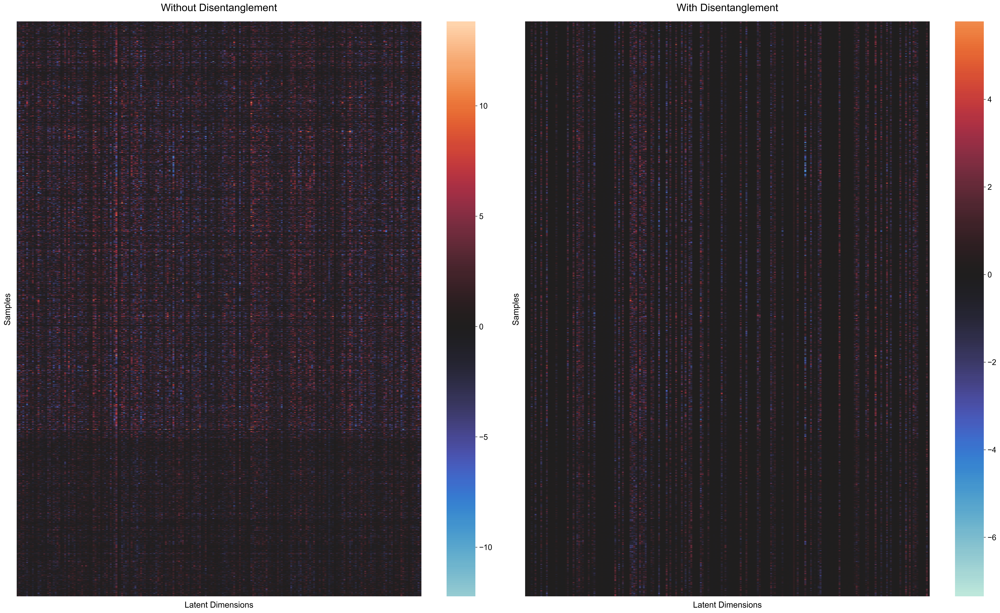

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(35, 20))

plt.subplots_adjust(wspace=0.005)

heatmap1 = sns.heatmap(vae_latent_nodipvae.drop(["Latent_106", "Latent_189"], axis=1), 
            annot=False, center=0, ax=axes[0], cbar=True)

cbar1 = heatmap1.collections[0].colorbar
cbar1.ax.tick_params(labelsize=15)
axes[0].set_title('Without Disentanglement', fontsize=20, pad=20)
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('Latent Dimensions', fontsize=16, labelpad=10)
axes[0].set_ylabel('Samples', fontsize=16, labelpad=10)

heatmap2 = sns.heatmap(vae_latent_dipvae.drop(["Latent_106", "Latent_108"], axis=1), 
            annot=False, center=0, ax=axes[1])

cbar2 = heatmap2.collections[0].colorbar
cbar2.ax.tick_params(labelsize=15)

axes[1].set_title('With Disentanglement', fontsize=20, pad=20)
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_xlabel('Latent Dimensions', fontsize=16, labelpad=10)
axes[1].set_ylabel('Samples', fontsize=16, labelpad=10)

plt.show()

PCA Analysis

In [11]:
PCs_variance_all = []

var_pca, PCs_variance = dipvae_metrics.variance_of_PCs_explained_variance(vae_latent_nodipvae)
PCs_variance_all.append([0, 0, PCs_variance])

var_pca, PCs_variance = dipvae_metrics.variance_of_PCs_explained_variance(vae_latent_dipvae)
PCs_variance_all.append([0.001, 0.001, PCs_variance])

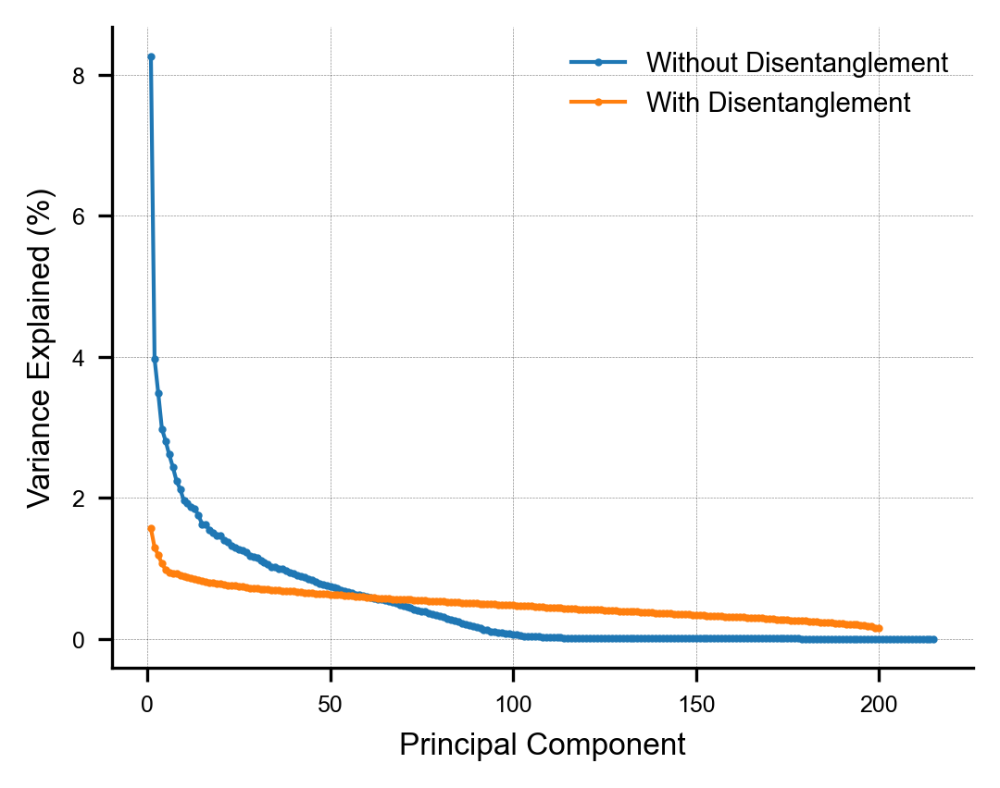

In [14]:
plt.figure(figsize=(4, 3))
plt.plot(
    range(1, len(PCs_variance_all[0][2]) + 1),
    PCs_variance_all[0][2] * 100,
    label="Without Disentanglement",
    marker="o",
    markersize=1, linewidth=1
)
plt.plot(
    range(1, len(PCs_variance_all[1][2]) + 1),
    PCs_variance_all[1][2] * 100,
    label="With Disentanglement",
    marker="o",
    markersize=1,
    linewidth=1,
)

plt.xlabel("Principal Component", fontsize=8)
plt.ylabel("Variance Explained (%)", fontsize=8)
plt.legend(fontsize=7)
plt.show()

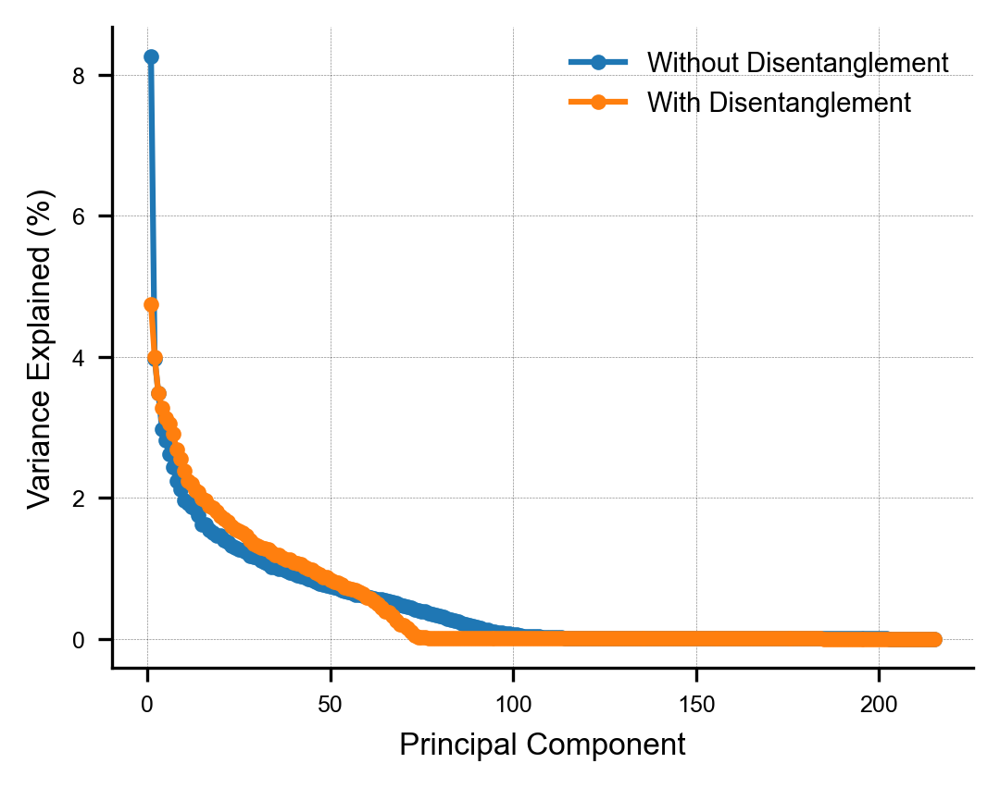

In [17]:
plt.figure(figsize=(4, 3))
plt.plot(range(1, len(PCs_variance_all[0][2]) + 1), PCs_variance_all[0][2]* 100, label= "Without Disentanglement", marker='o', markersize = 3)
plt.plot(range(1, len(PCs_variance_all[1][2]) + 1), PCs_variance_all[1][2] * 100, label= "With Disentanglement", marker='o', markersize = 3)

plt.xlabel('Principal Component', fontsize=8)
plt.ylabel('Variance Explained (%)', fontsize=8)
plt.legend(fontsize=7)
plt.show()

Correlation between Latent Dimensions and VIM and CDH1

In [17]:
hyperparameters = Hypers.read_hyperparameters(timestamp= timestamp_nodipvae)

clines_db = CLinesDatasetDepMap23Q2(
    datasets=hyperparameters["datasets"],
    labels_names=hyperparameters["labels"],
    standardize=hyperparameters["standardize"],
    filter_features=hyperparameters["filter_features"],
    filtered_encoder_only=hyperparameters["filtered_encoder_only"],
    feature_miss_rate_thres=hyperparameters["feature_miss_rate_thres"],
)

# ---- Hyperparameters
{
    "activation_function": "prelu",
    "batch_norm": false,
    "batch_size": 76,
    "contrastive_neg_margin": 0.15,
    "contrastive_pos_margin": 0.85,
    "dataname": "depmap23Q2",
    "datasets": {
        "copynumber": "/home/scai/PhenPred/data/clines//cnv_summary_20230303_matrix.csv",
        "crisprcas9": "/home/scai/PhenPred/data/clines//depmap23Q2/CRISPRGeneEffect.csv",
        "drugresponse": "/home/scai/PhenPred/data/clines//drugresponse.csv",
        "metabolomics": "/home/scai/PhenPred/data/clines//metabolomics.csv",
        "methylation": "/home/scai/PhenPred/data/clines//methylation.csv",
        "proteomics": "/home/scai/PhenPred/data/clines//proteomics.csv",
        "transcriptomics": "/home/scai/PhenPred/data/clines//depmap23Q2/OmicsExpressionGenesExpectedCountProfileVoom.csv"
    },
    "feature_dropout": 0,
    "feature_miss_rate_thres": 0.85,
    "filter_features": [
        "transcriptomics",
        "crisprcas9",
        "methylation"
  

/home/scai/PhenPred/PhenPred/vae/DatasetDepMap23Q2.py:234: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  self.labels = self.labels.reindex(index=self.samples).fillna(0)


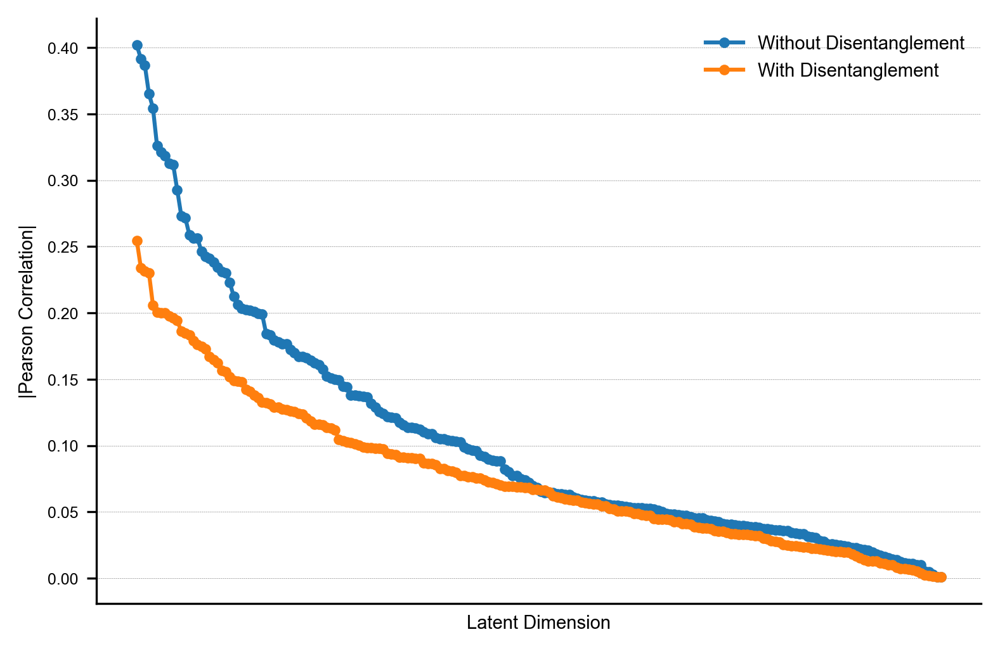

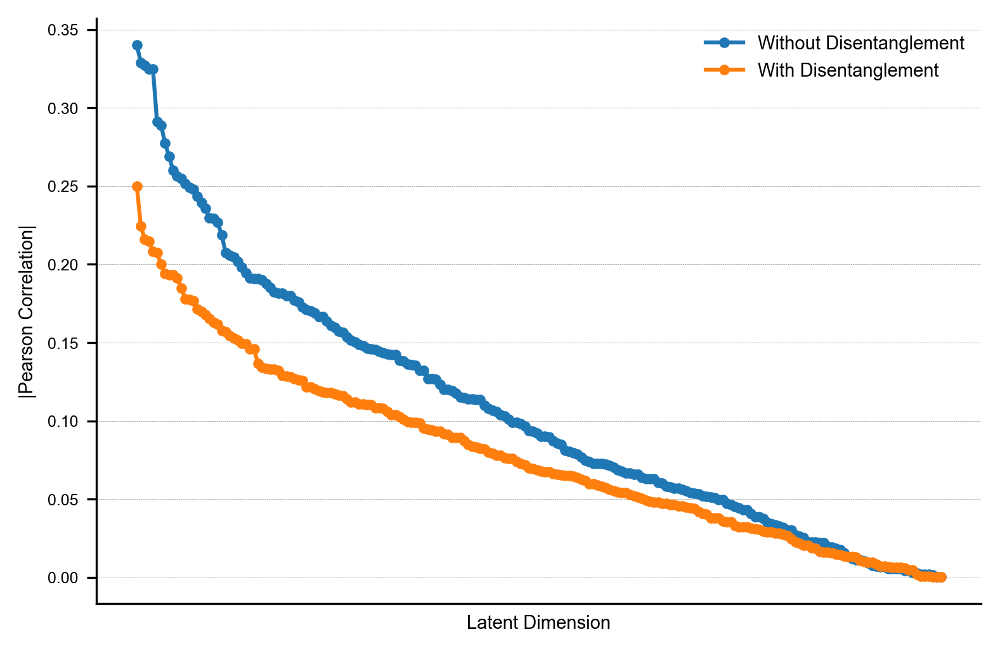

In [22]:
markers = clines_db.get_features(dict(proteomics=["VIM", "CDH1"]))
dipvae_metrics.corr_VIM_CDH1(vae_latent_nodipvae.iloc[:,:200], vae_latent_dipvae, markers)

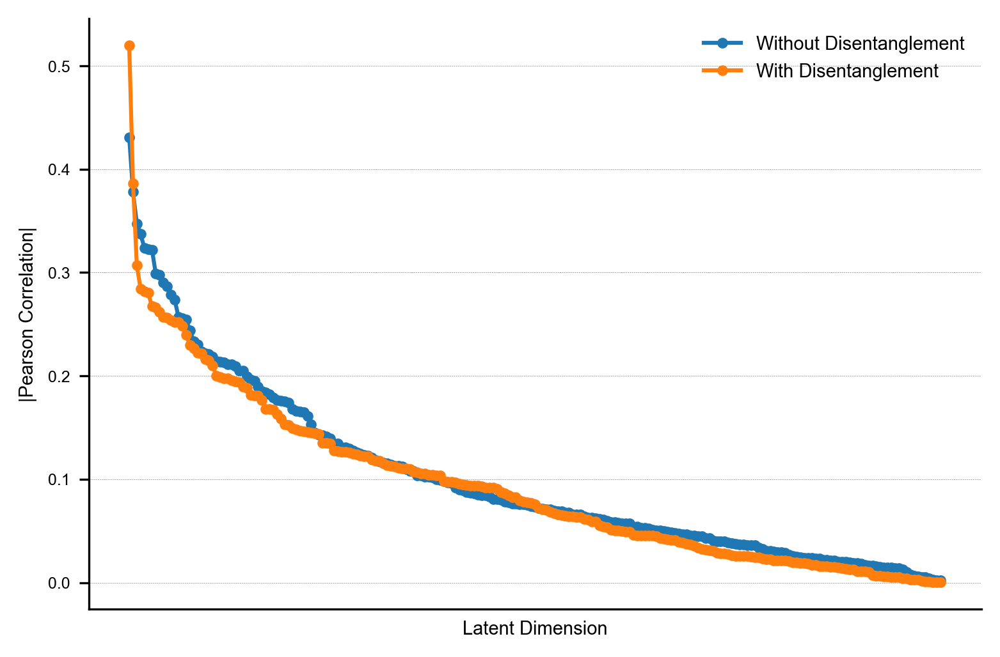

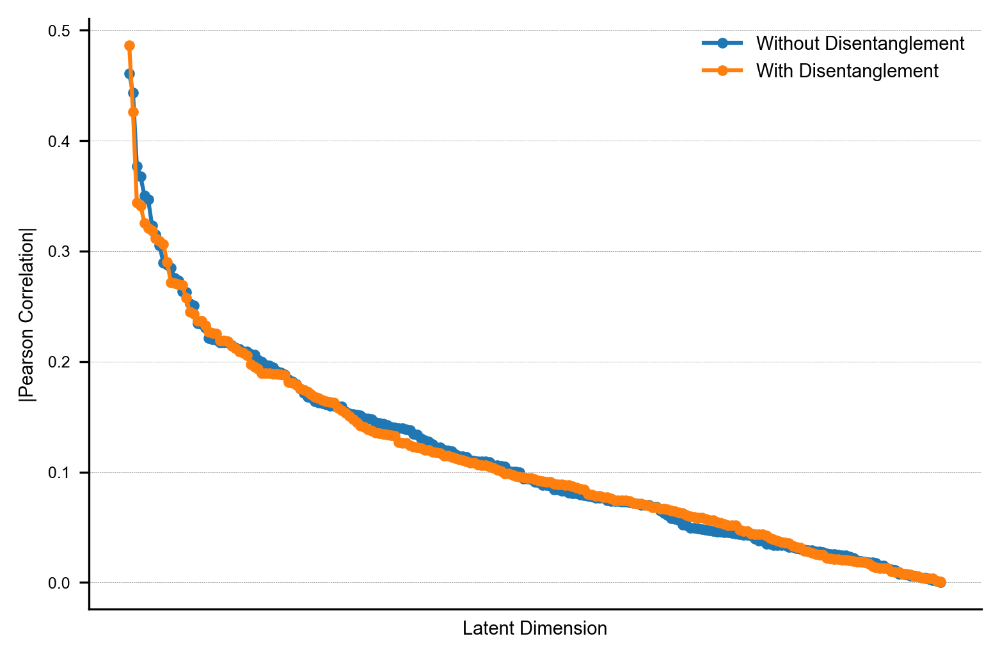

In [20]:
markers = clines_db.get_features(dict(transcriptomics=["VIM", "CDH1"]))
dipvae_metrics.corr_VIM_CDH1(vae_latent_nodipvae, vae_latent_dipvae, markers)